# **DOMAIN ADAPTATION ALGORITHMS EVALUATION**

## **LIBRARIES**

In [ ]:
import os
import torch
import numpy as np
import soundfile as sf
import librosa
from tqdm import tqdm
import yaml
import pandas as pd
import seaborn as sns
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils import resample
from scipy.stats import wasserstein_distance
from typing import Union, Tuple
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [4]:
# Load audio processing constants from config.yaml
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)

SAMPLING_RATE = config["audio_processing"]["sampling_rate"] # Resample the audio files with frequency 4 kHz, since wheezes and crackles are typically within frequency range 0–2 kHz
FRAME_LENGTH = config["audio_processing"]["frame_length"] # Use window size of 60 ms for each cycle
HOP_LENGTH = config["audio_processing"]["hop_length"] # Use 50% overlap
N_MFCC = config["audio_processing"]["n_mfcc"] # Extract the first 13 MFCCs
N_MELS = config["audio_processing"]["n_mels"] # Use 64 Mel Banks to extract the Log-Mel Spectrograms
F_HI = config["audio_processing"]["f_hi"] # Boundary frequency for VLTP is set to 2 kHz
TARGET_DURATION = config["audio_processing"]["target_duration"] # Fix the duration of each cycle to 8 s

FRAME_SIZE = int(FRAME_LENGTH*SAMPLING_RATE) # Calculate the amount of samples per frame
HOP_SIZE = int(HOP_LENGTH*SAMPLING_RATE) #  Calculate the amount of samples per hop

# Load basic paths from config.yaml
RAW_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["raw_cycle_folder"])
AUG_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["aug_cycle_folder"])
CLEANED_CYCLE_FOLDER = os.path.join(os.getcwd(), config["paths"]["cleaned_cycle_folder"])
TRAINING_SET_FOLDER = os.path.join(os.getcwd(), config["paths"]["training_set_folder"])
TEST_SET_FOLDER = os.path.join(os.getcwd(), config["paths"]["test_set_folder"])

# Feature names 
FEATURE_NAMES = (
    [f"MFCC_{i}" for i in range(N_MFCC)] +
    ["Spectral Centroid", "Spectral Bandwidth", "Zero Crossing Rate", "RMS Energy",
     "Spectral Rolloff", "Spectral Flux", "Spectral Flatness"] 
    + [f"Log Mel_{i}" for i in range(N_MELS)] + ["On Set Envelope"]
)

# Number of features used
N_FEATURES = len(FEATURE_NAMES) 

# Device names 
DEVICES = ["AKGC417L", "LittC2SE", "Litt3200", "Meditron"]
REFERENCE_DEVICE = "Meditron"

In [5]:
# Load training and test sets
train_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "raw_training_set.csv"))
final_train_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "training_set.csv"))
augmented_labels_df = pd.read_csv(os.path.join(TRAINING_SET_FOLDER, "augmented_training_set.csv"))
test_df = pd.read_csv(os.path.join(TEST_SET_FOLDER, "test_set.csv"))

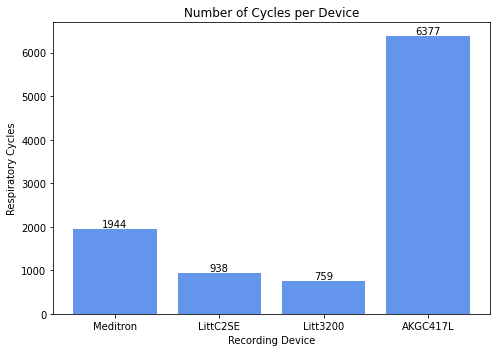

In [6]:
device_counts = Counter()

# Count the initial respiratory cycles of each device
for fname in os.listdir(CLEANED_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        matched_device = next((d for d in DEVICES if d in fname), None)
        if matched_device:
            device_counts[matched_device] += 1

# Bar plot
plt.figure(figsize=(7, 5))
plt.bar(device_counts.keys(), device_counts.values(), color="cornflowerblue")
plt.title("Number of Cycles per Device")
plt.xlabel("Recording Device")
plt.ylabel("Respiratory Cycles")

for i, (device, count) in enumerate(device_counts.items()):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
# Extract device names from training filenames 
device_labels = []
for fname in final_train_df['file']:
    matched_device = next((d for d in DEVICES if d in fname), None)
    device_labels.append(matched_device)

np.save("training_devices.npy", np.array(device_labels))

In [ ]:
# Extract device names from test filenames 
device_labels = []
for fname in test_df['file']:
    matched_device = next((d for d in DEVICES if d in fname), None)
    device_labels.append(matched_device)

np.save("test_devices.npy", np.array(device_labels))

In [7]:
def extract_device(filename):
    for device in DEVICES:
        if device in filename:
            return device
    return "Unknown"

train_df["device"] = train_df["file"].apply(extract_device)
device_class_counts = train_df.groupby(["class", "device"]).size().unstack().fillna(0).astype(int)
print(device_class_counts)

device   AKGC417L  Litt3200  LittC2SE  Meditron
class                                          
Crackle      1234        22        64       171
Normal       1537       266       287       823
Wheeze        401        88        98       122


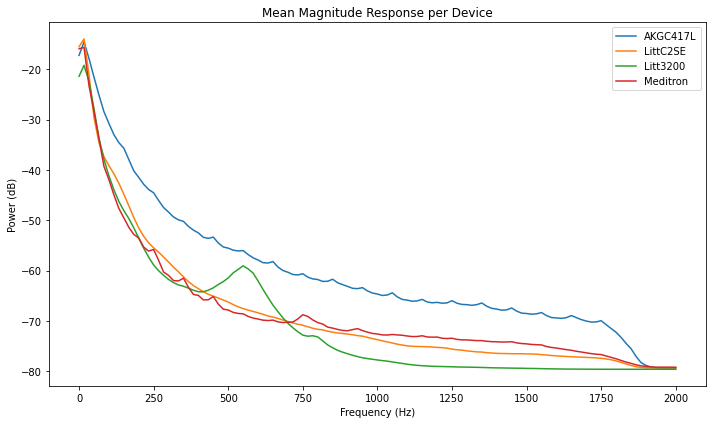

In [29]:
device_signals = {d: [] for d in DEVICES}

for fname in os.listdir(RAW_CYCLE_FOLDER):
    if fname.endswith(".wav"):
        device = next((d for d in DEVICES if d in fname), None)
        if device:
            y, _ = librosa.load(os.path.join(RAW_CYCLE_FOLDER, fname), sr=SAMPLING_RATE)
            device_signals[device].append(y)

# Calculate the mean magnitude response of each device
plt.figure(figsize=(10, 6))

for device in DEVICES:
    signals = device_signals[device]

    all_psd = []
    for y in signals:
        # STFT to Power Spectrogram
        S = np.abs(librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE))**2
        S_db = librosa.power_to_db(S, ref=np.max)
        mean_spectrum = np.mean(S_db, axis=1)  # Get mean value over time
        all_psd.append(mean_spectrum)

    avg_psd = np.mean(np.stack(all_psd), axis=0)
    freqs = librosa.fft_frequencies(sr=SAMPLING_RATE, n_fft=FRAME_SIZE)
    plt.plot(freqs, avg_psd, label=device)

plt.title("Mean Magnitude Response per Device")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (dB)")
plt.legend()
plt.tight_layout()
plt.show()

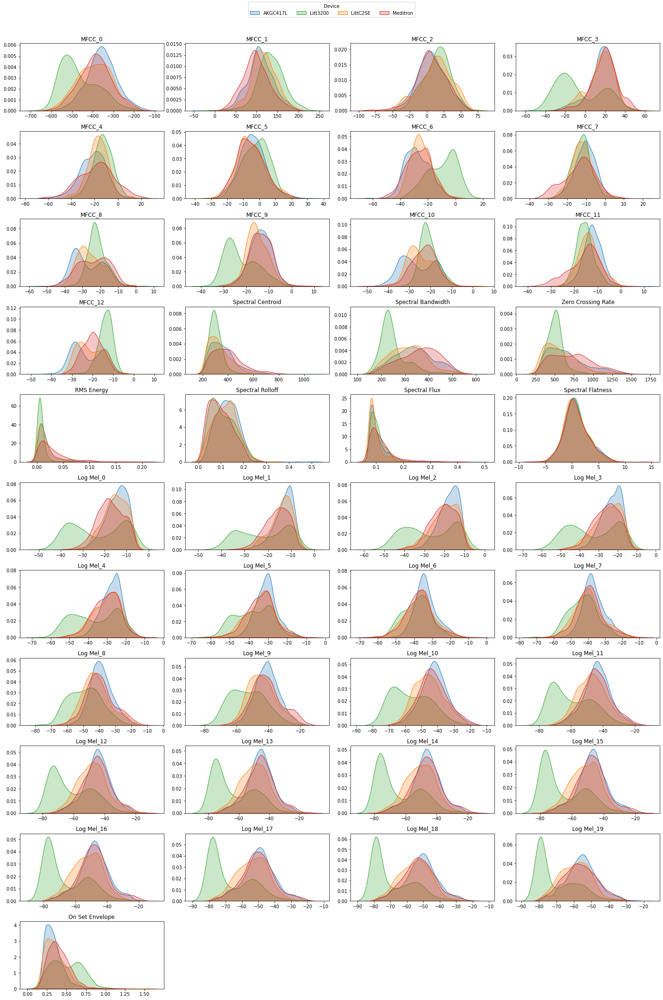

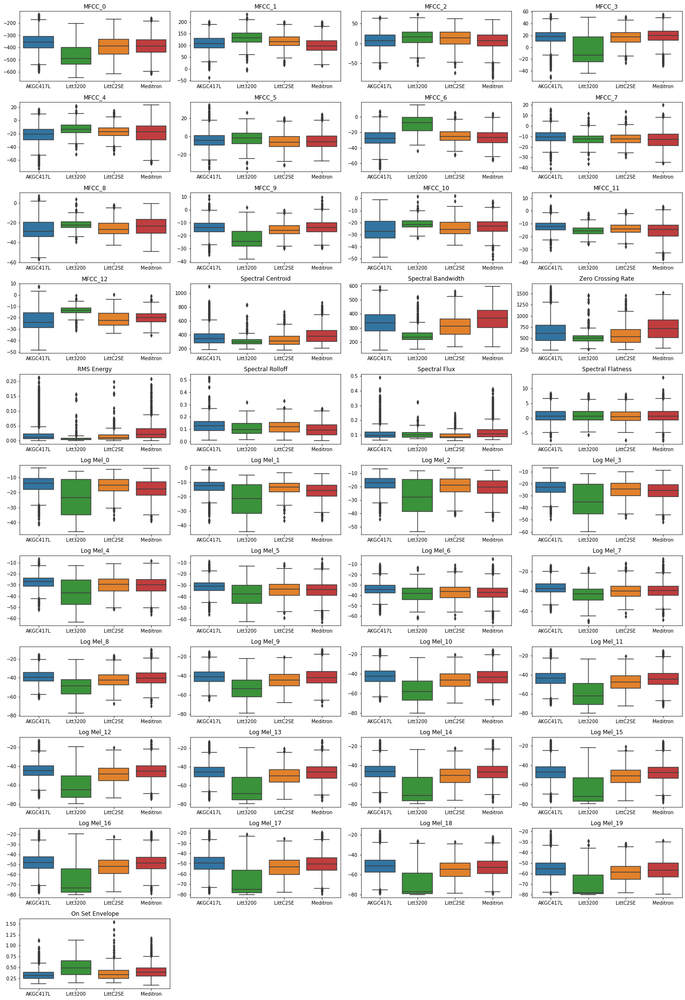

In [8]:
from utils.plots import plot_feature_distributions_by_device

# Load training set data
training_features_mean = np.load("training_features_mean.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_mean, training_devices, FEATURE_NAMES)

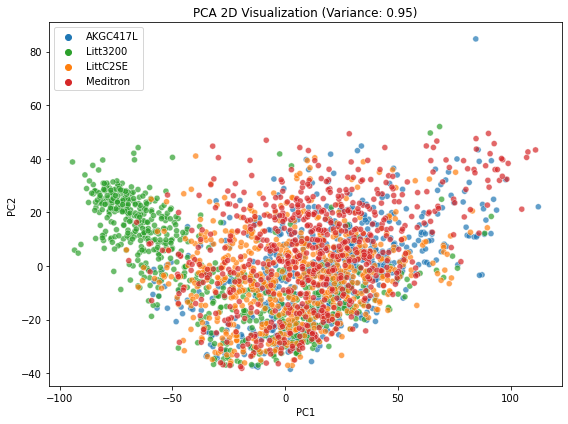

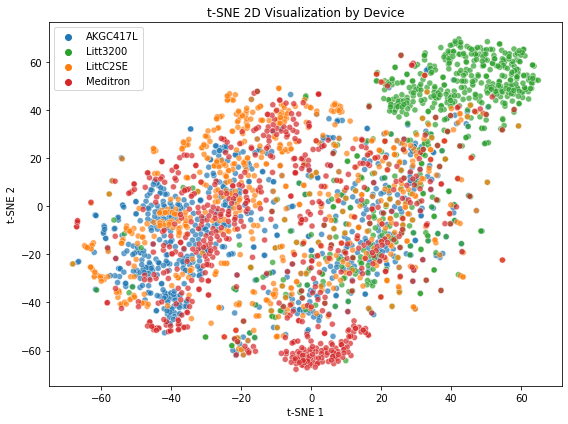

In [11]:
from utils.plots import perform_pca_and_tsne_by_device

training_features_flattened = np.load("training_features_flattened.npy")

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_flattened[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Detect the existing domain ahift using a Domain Classifier

Accuracy per fold: [0.5833 0.572  0.6098 0.536  0.6042]
Mean accuracy: 0.5811 ± 0.0264


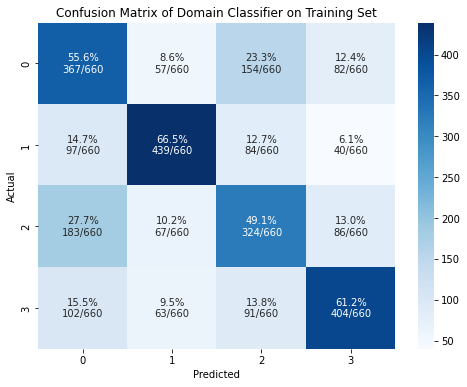

In [14]:
# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

The analysis reveals that there is a moderate domain shift between devices in the dataset. This is supported by two key observations: 

(1) the PCA and t-SNE visualizations show partial clustering by device, with some overlap but also noticeable separation — particularly for certain devices like Litt3200 

(2) the domain classifier achieves an accuracy of approximately 58% on a balanced dataset, which is significantly higher than random guessing (25%). This indicates that device identity influences the feature space.

### **SPECTRUM CORRECTION**

In [19]:
from domain_adaptation_algorithms.aligned_spectrum_correction import *

device_segments = {device: {} for device in DEVICES}

for _, row in train_df.iterrows():
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)
    if device:
        path = os.path.join(RAW_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_segments[device].setdefault(class_name, []).append(y)

# Create aligned_segments (list of dicts)
aligned_segments = []
classes = set(train_df["class"])
min_len_per_class = {
    c: min(len(device_segments[d].get(c, [])) for d in DEVICES)
    for c in classes
}

for class_name in classes:
    for i in range(min_len_per_class[class_name]):
        segment = {"class": class_name}
        for device in DEVICES:
            segment[device] = device_segments[device][class_name][i]
        aligned_segments.append(segment)

# Fit Spectrum Correction
correction = SpectrumCorrection(num_fft=FRAME_SIZE, hop_length=HOP_SIZE)
correction.fit(aligned_segments, reference_device=REFERENCE_DEVICE)

In [ ]:
SC_TRAIN_FOLDER = "corrected_train_sc"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of preprocessed training set 
for fname in tqdm(final_train_df["file"], desc="Applying Spectrum Correction on training set"):
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != "Meditron":
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Spectrum Correction on training set: 100%|██████████| 8739/8739 [01:17<00:00, 112.72it/s]


In [20]:
SC_TRAIN_FOLDER = "corrected_train_sc"
os.makedirs(SC_TRAIN_FOLDER, exist_ok=True)

for _, row in tqdm(final_train_df.iterrows(), total=len(final_train_df), desc="Applying Aligned Spectrum Correction on training set"):
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TRAIN_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device=device, class_name=class_name)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Aligned Spectrum Correction on training set: 100%|██████████| 8739/8739 [01:08<00:00, 126.73it/s]


In [84]:
SC_TEST_FOLDER = "corrected_test_sc"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

# Apply Spectrum Correction only on non-reference devices of testing set 
for fname in tqdm(test_df["file"], desc="Applying Spectrum Correction on test set"):
    device = next((d for d in devices if d in fname), None)
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    if device != "Meditron":
        y = correction.transform_wave(y, device)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Spectrum Correction on test set: 100%|██████████| 1279/1279 [00:10<00:00, 127.82it/s]


In [21]:
SC_TEST_FOLDER = "corrected_test_sc"
os.makedirs(SC_TEST_FOLDER, exist_ok=True)

for _, row in tqdm(test_df.iterrows(), total=len(test_df), desc="Applying Aligned Spectrum Correction on test set"):
    fname = row["file"]
    class_name = row["class"]  
    device = next((d for d in DEVICES if d in fname), None)

    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(SC_TEST_FOLDER, fname)

    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)

    if device != REFERENCE_DEVICE:
        y = correction.transform_wave(y, device=device, class_name=class_name)

    sf.write(output_path, y, SAMPLING_RATE)

Applying Aligned Spectrum Correction on test set: 100%|██████████| 1279/1279 [00:09<00:00, 141.08it/s]


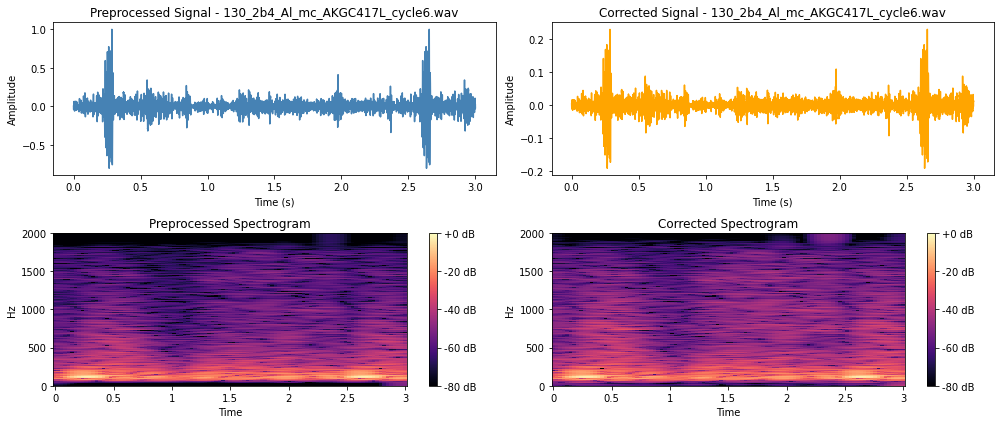

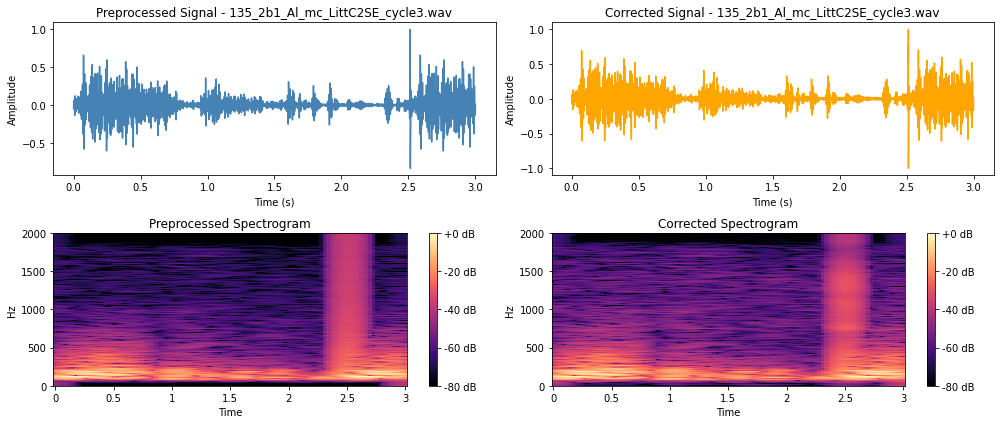

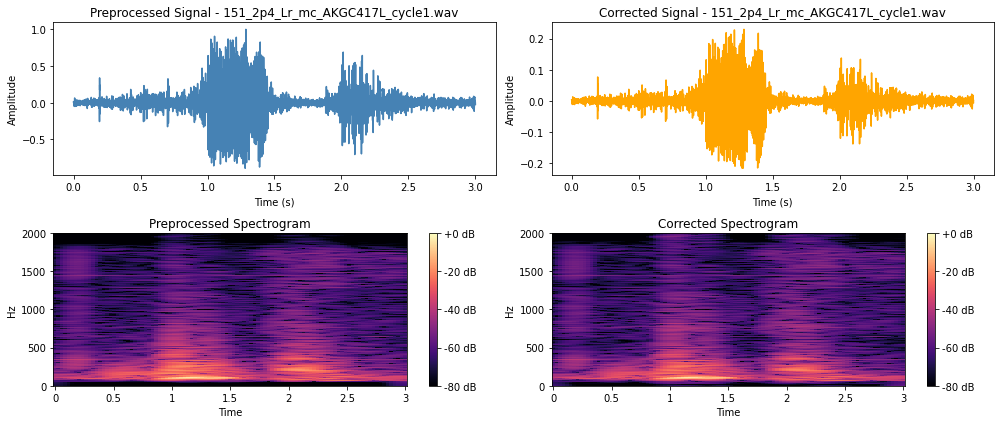

In [22]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the reference device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains(REFERENCE_DEVICE)]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=SC_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

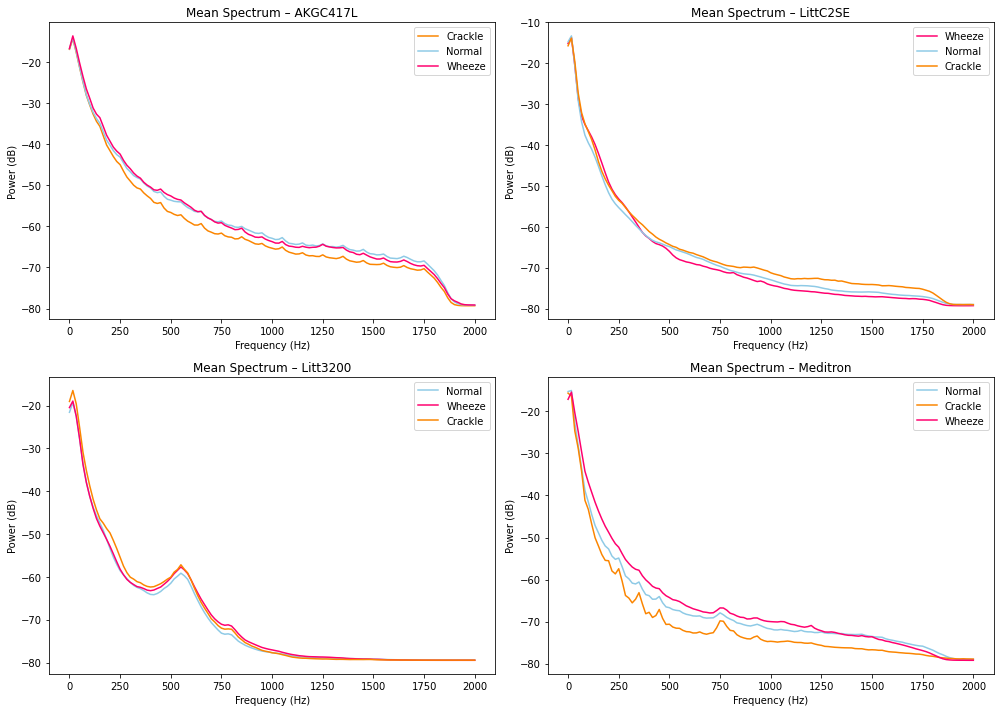

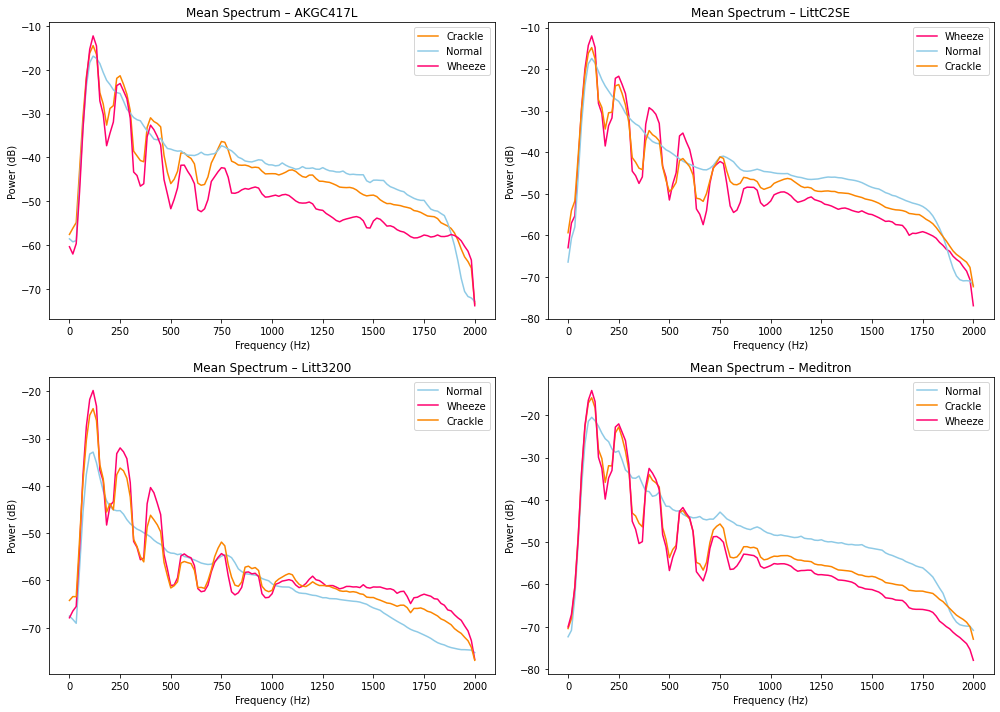

In [24]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=SC_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

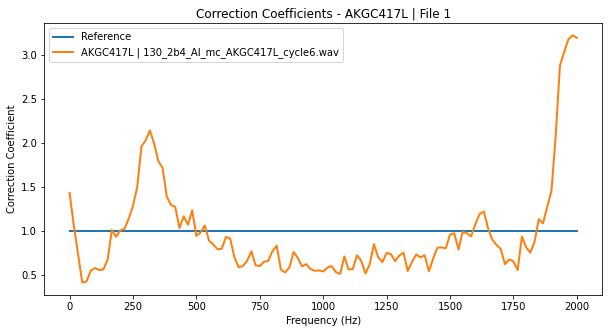

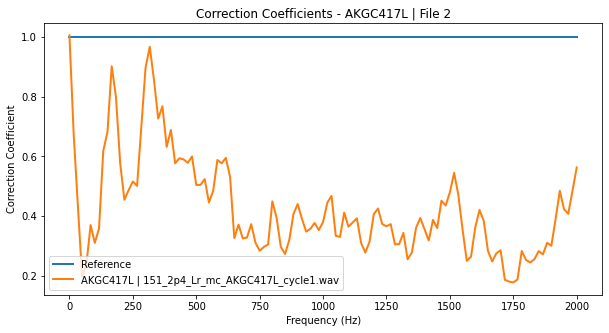

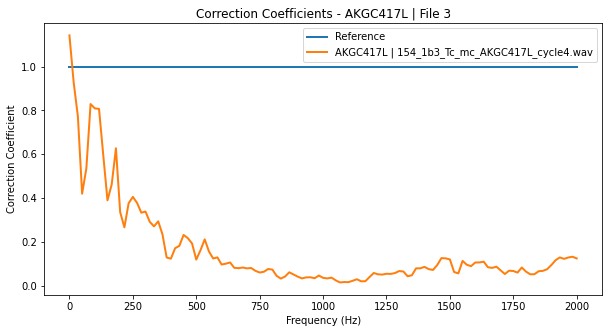

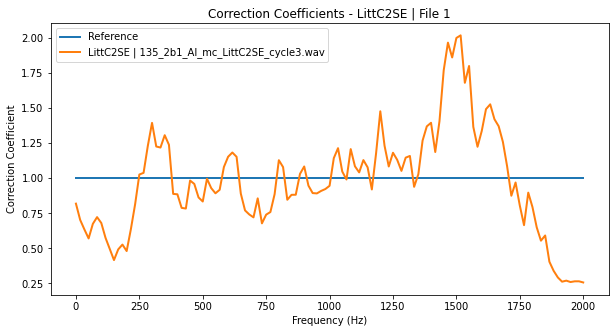

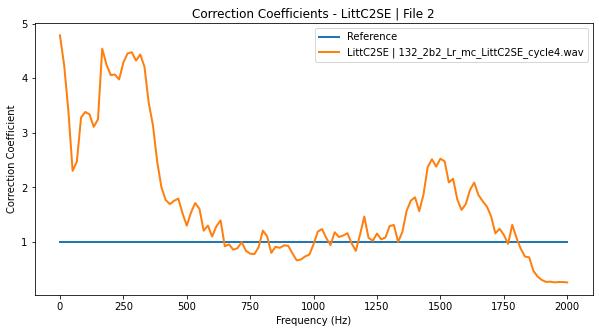

...

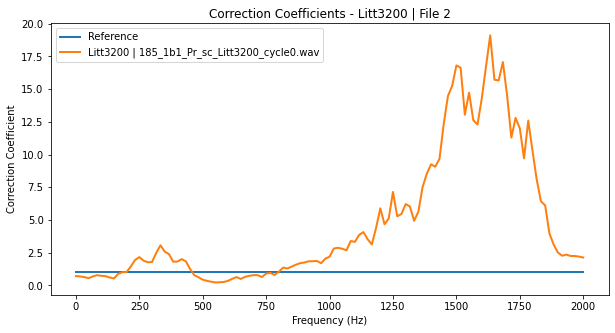

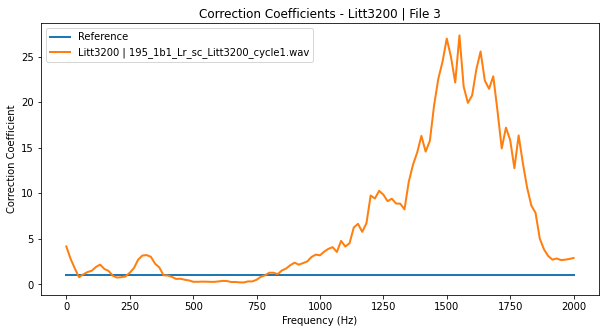

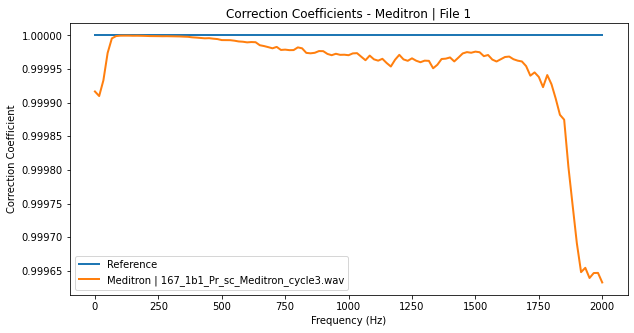

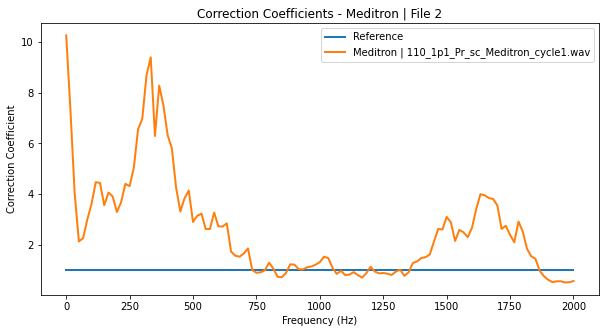

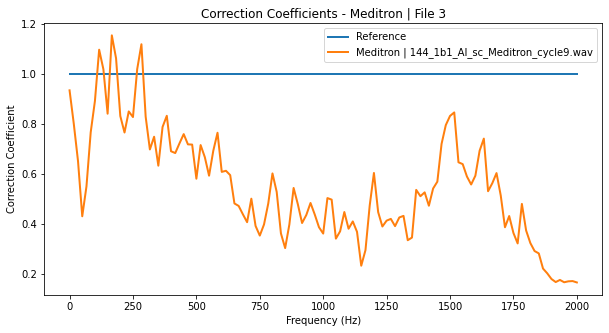

In [23]:
device_files = {d: [] for d in DEVICES}

for fname in final_train_df["file"]:
    device = next((d for d in DEVICES if d in fname), None)
    if device:
        path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
        y, _ = librosa.load(path, sr=SAMPLING_RATE)
        device_files[device].append((fname, y))

# Plot the correction coefficients for the first 3 files of each recording device
correction.plot_correction_coefficients(
    device_files=device_files,
    reference_device=REFERENCE_DEVICE,
    k=3,
    sr=SAMPLING_RATE
)

Extract acoustic features from the corrected .wav signals

In [25]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(SC_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(SC_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_sc.npy", train_features_mean)
np.save("training_filenames_sc.npy", train_filenames_array)
np.save("training_labels_sc.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:26<00:00, 42.38it/s]


In [26]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(SC_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(SC_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays 
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_sc.npy", test_features_mean)
np.save("test_filenames_sc.npy", test_filenames_array)
np.save("test_labels_sc.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:31<00:00, 40.81it/s]


Calculate some distribution distance metrics (Wasserstein, JS) to check how much aligned are the distributions of the corrected features

In [27]:
from utils.metrics import mean_wasserstein

REFERENCE_DEVICE = 'Meditron'
x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_sc.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  2.0178
Wasserstein relevant reduction: 65.11%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  2.3489
Wasserstein relevant reduction: 74.06%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  2.2785
Wasserstein relevant reduction: 89.00%



In [28]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1222
JS relevant reduction: 39.41%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1846
JS relevant reduction: 25.68%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.1929
JS relevant reduction: 58.71%



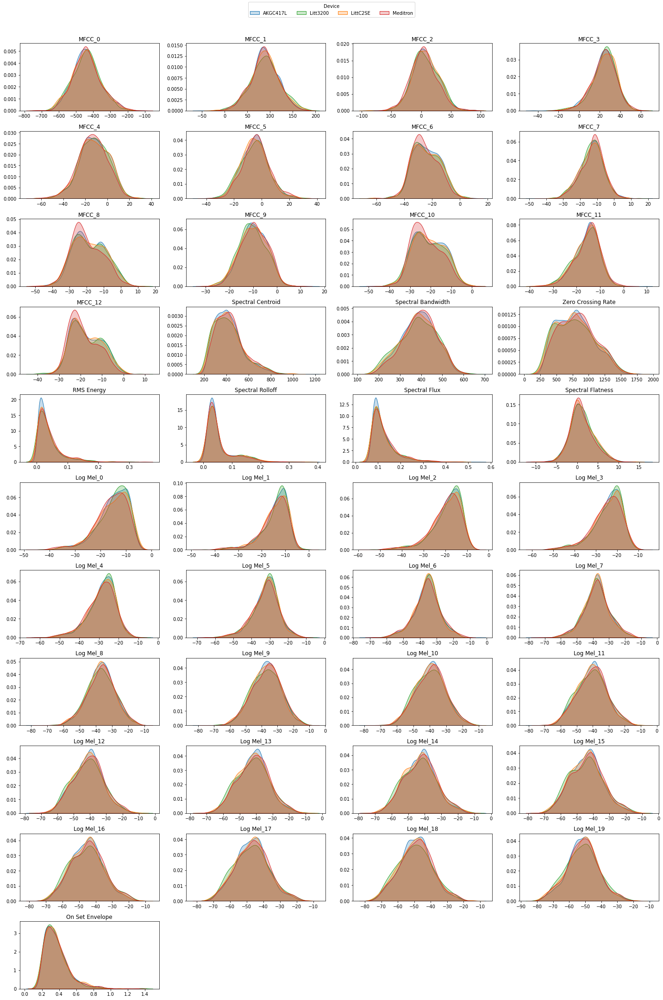

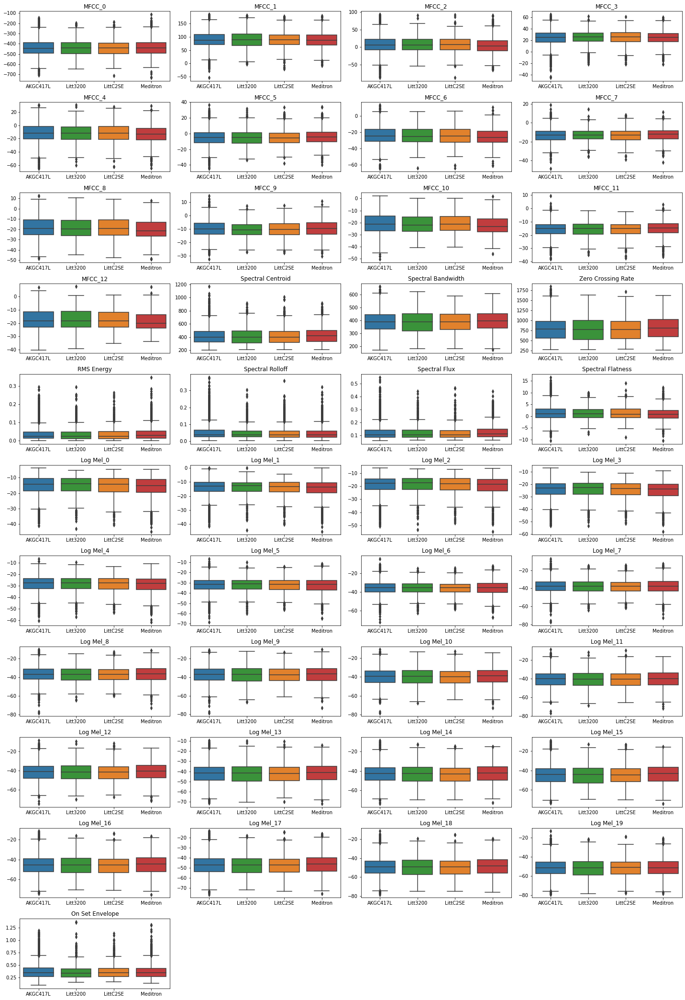

In [34]:
training_features_sc = np.load("training_features_sc.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_sc, training_devices, FEATURE_NAMES)

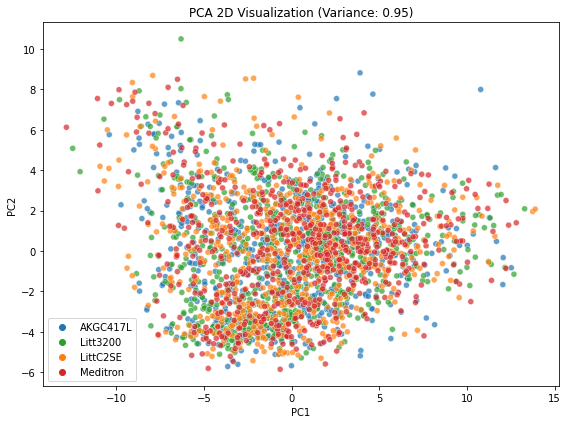

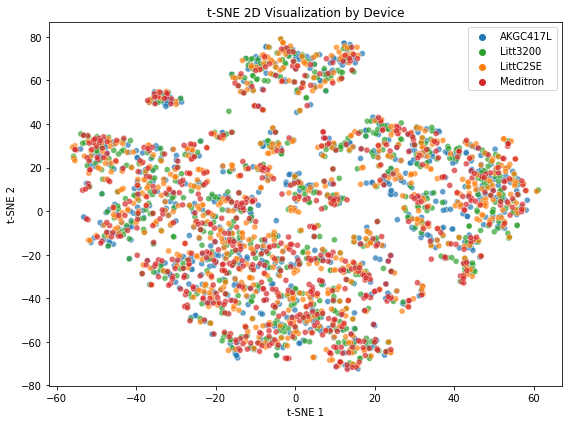

In [ ]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_sc[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

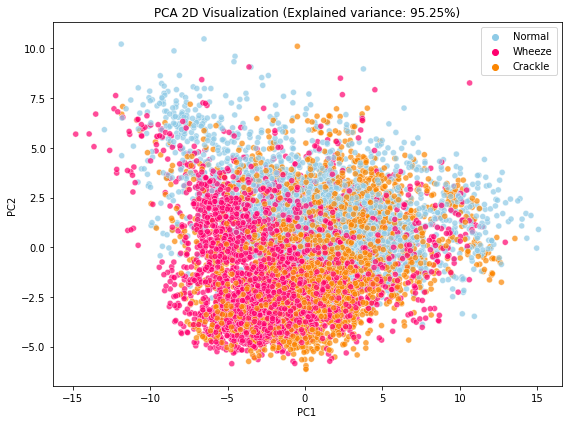

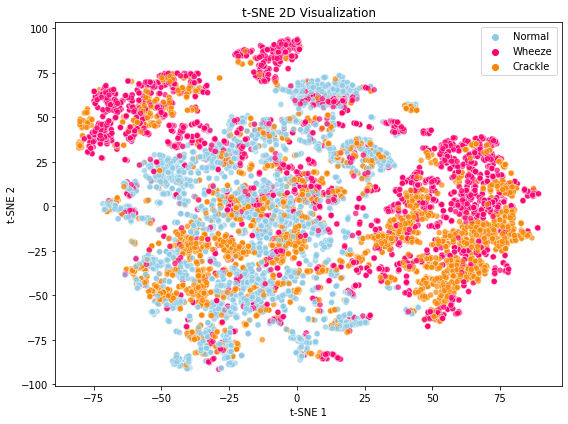

In [32]:
from utils.plots import perform_pca_and_tsne

training_labels_sc = np.load("training_labels_sc.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_sc,  # shape: (cycles, features)
    labels=training_labels_sc,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2595 0.2519 0.2462 0.2178 0.2652]
Mean Domain Classification Accuracy: 0.2481 ± 0.0165


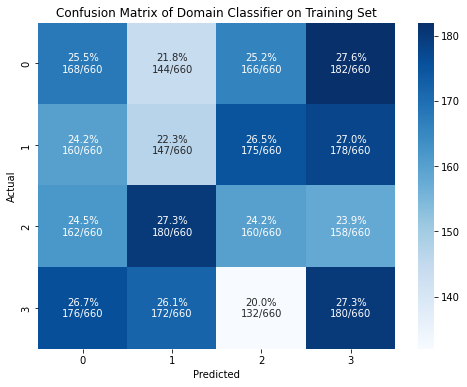

In [33]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_sc[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

### **SPECTRUM NORMALIZATION**

In [36]:
from domain_adaptation_algorithms.spectrum_normalization import *

standardizer = ClassWiseSpectralStandardizer(n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

# Prepare data
train_files = [os.path.join(RAW_CYCLE_FOLDER, f) for f in train_df["file"]]
train_labels = train_df["class"].tolist()
train_devices = [next((d for d in DEVICES if d in f), None) for f in train_df["file"]]

# Fit reference class stats of raw data
standardizer.fit(train_files, train_labels, train_devices, reference_device=REFERENCE_DEVICE)

In [38]:
# Apply transform on training set
STANDARDIZED_TRAIN_FOLDER = "corrected_train_standardized"
os.makedirs(STANDARDIZED_TRAIN_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(final_train_df["file"], final_train_df["class"]), total=len(final_train_df), desc="Applying Spectrum Standardization on training set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(STANDARDIZED_TRAIN_FOLDER, fname)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue
    
    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    stft = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    phase = np.angle(stft)
    
    norm_spec = standardizer.transform(y, class_name=label)
    y_corrected = standardizer.transform_inverse(norm_spec, phase, len(y))
    
    sf.write(output_path, y_corrected, SAMPLING_RATE)

Applying Spectrum Standardization on training set: 100%|██████████| 8739/8739 [02:47<00:00, 52.25it/s]


In [39]:
# Apply transform on test set
STANDARDIZED_TEST_FOLDER = "corrected_test_standardized"
os.makedirs(STANDARDIZED_TEST_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(test_df["file"], test_df["class"]), total=len(test_df), desc="Applying Spectrum Standardization on test set"):
    input_path = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    output_path = os.path.join(STANDARDIZED_TEST_FOLDER, fname)

    if not os.path.exists(input_path):
        print(f"[!] Missing: {input_path}")
        continue
    
    y, _ = librosa.load(input_path, sr=SAMPLING_RATE)
    stft = librosa.stft(y, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    phase = np.angle(stft)
    
    norm_spec = standardizer.transform(y, class_name=label)
    y_corrected = standardizer.transform_inverse(norm_spec, phase, len(y))
    
    sf.write(output_path, y_corrected, SAMPLING_RATE)

Applying Spectrum Standardization on test set: 100%|██████████| 1279/1279 [00:29<00:00, 42.88it/s]


In [40]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(STANDARDIZED_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(STANDARDIZED_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_std.npy", train_features_mean)
np.save("training_filenames_std.npy", train_filenames_array)
np.save("training_labels_std.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:42<00:00, 39.32it/s]


In [41]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(STANDARDIZED_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(STANDARDIZED_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_std.npy", test_features_mean)
np.save("test_filenames_std.npy", test_filenames_array)
np.save("test_labels_std.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:32<00:00, 39.48it/s]


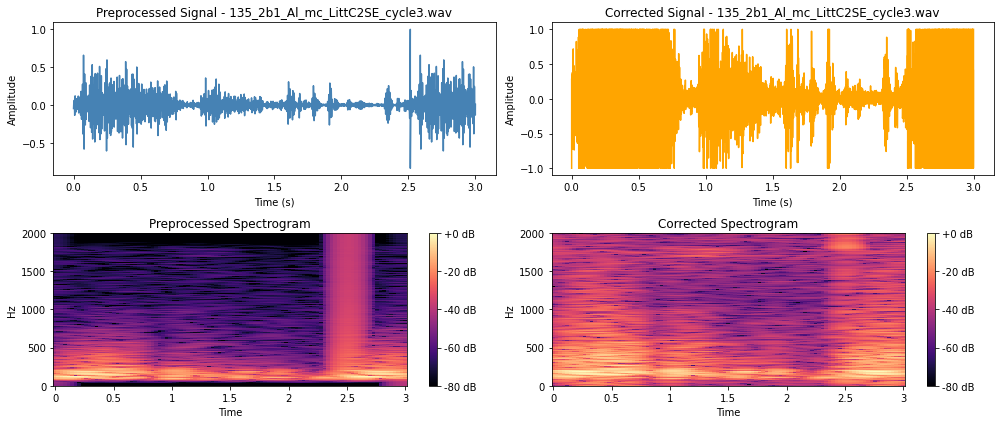

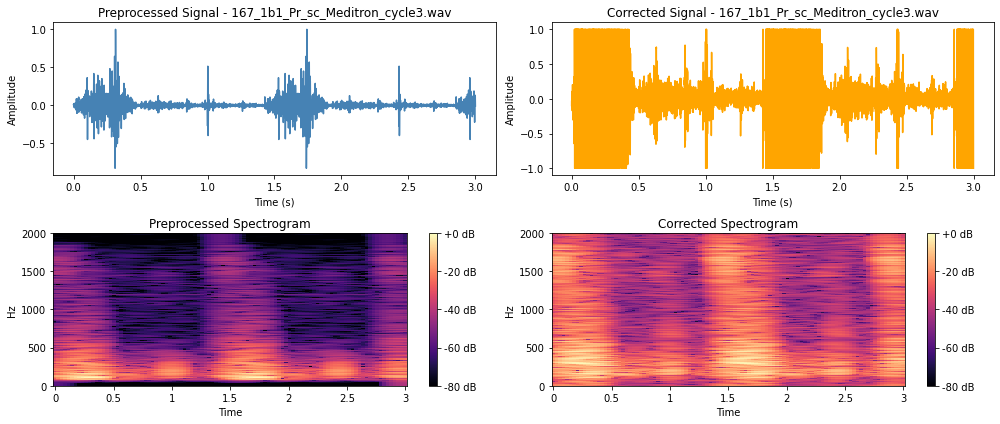

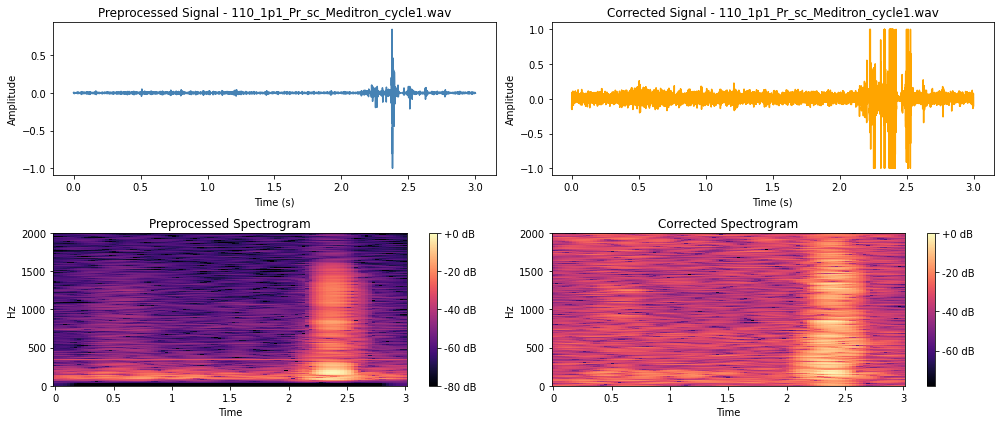

In [42]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains("AKGC417L")]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=STANDARDIZED_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

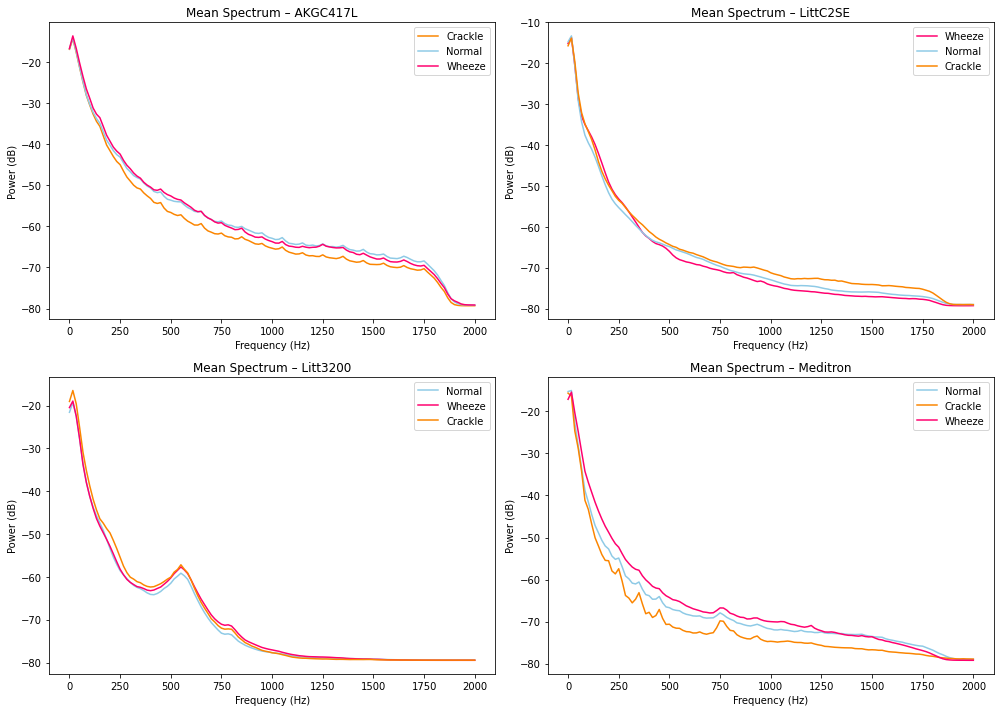

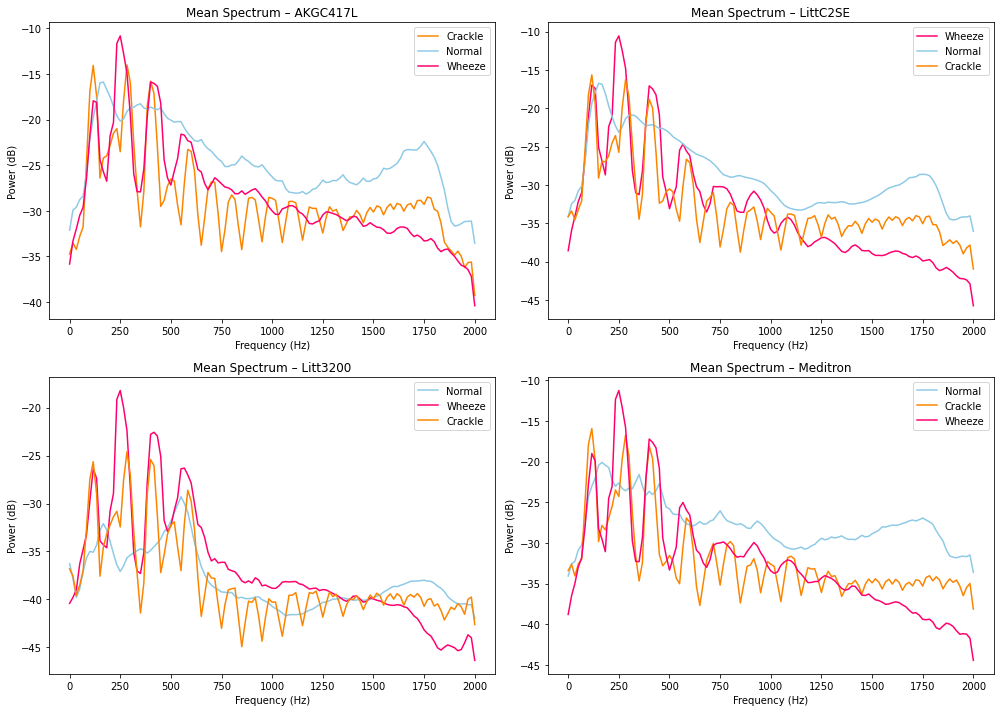

In [43]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=STANDARDIZED_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

In [44]:
from utils.metrics import mean_wasserstein

x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_std.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  1.8642
Wasserstein relevant reduction: 67.77%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  1.7857
Wasserstein relevant reduction: 80.28%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  2.1810
Wasserstein relevant reduction: 89.47%



In [45]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1235
JS relevant reduction: 38.79%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1903
JS relevant reduction: 23.41%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.1960
JS relevant reduction: 58.05%



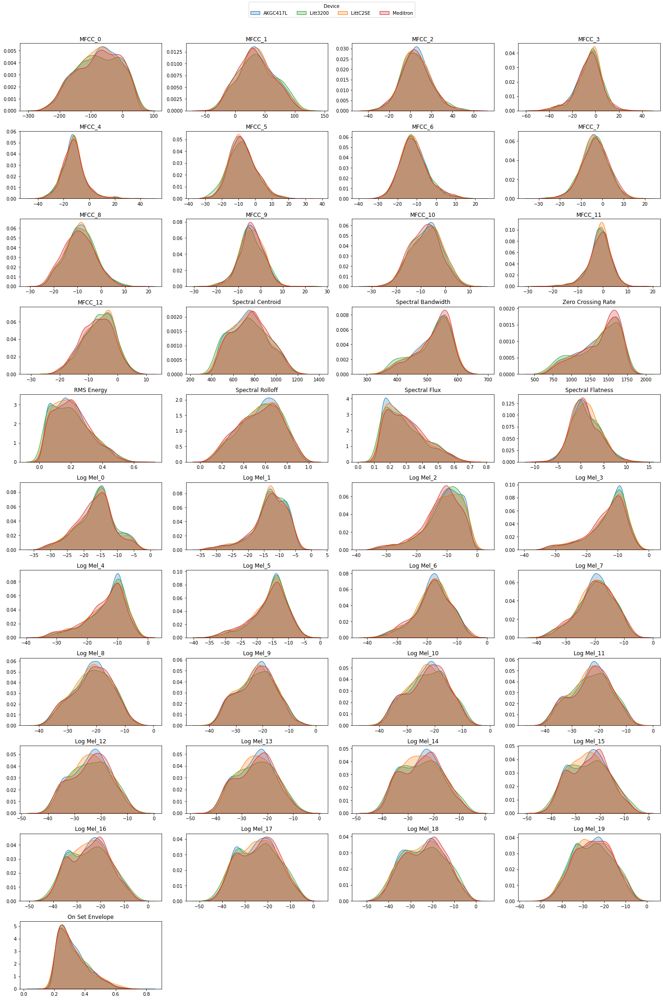

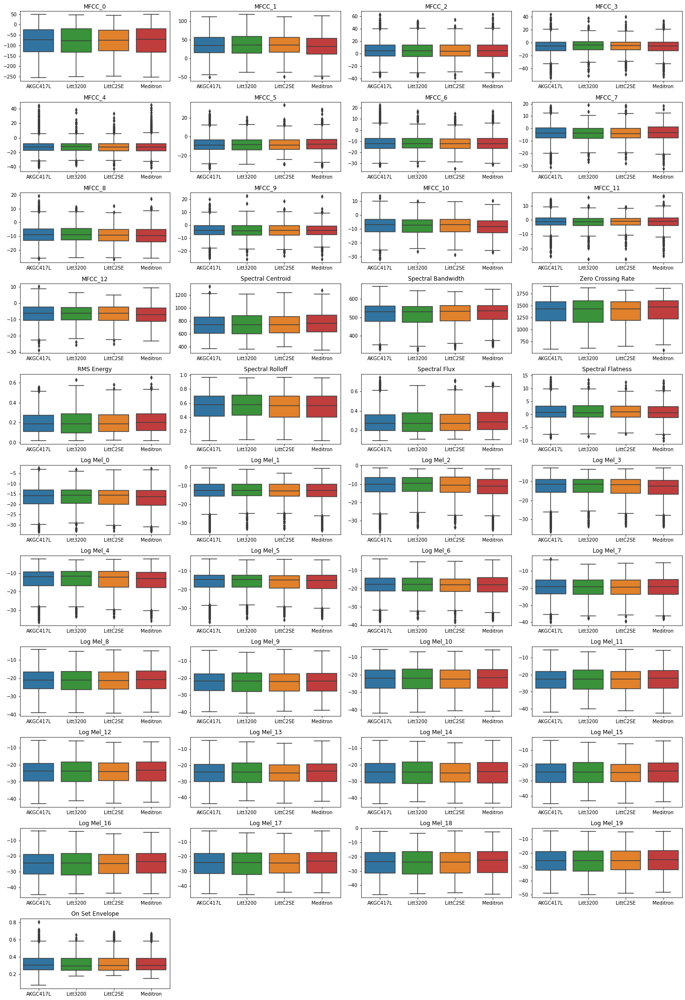

In [46]:
from utils.plots import plot_feature_distributions_by_device

training_features_std = np.load("training_features_std.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_std, training_devices, FEATURE_NAMES)

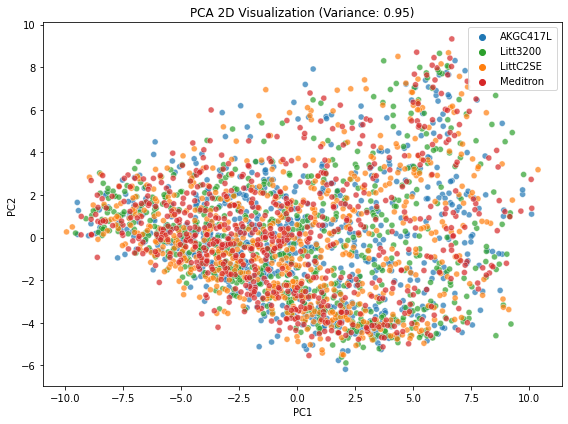

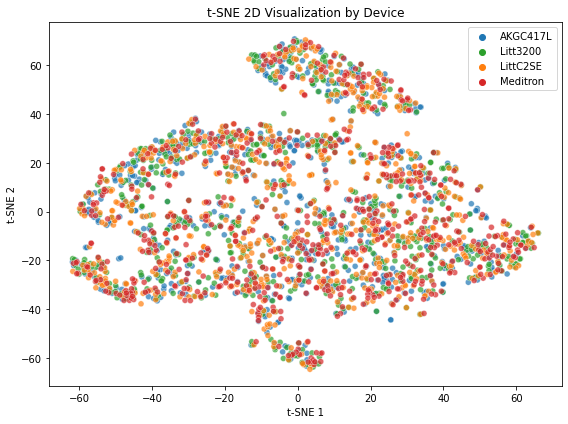

In [47]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_std[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

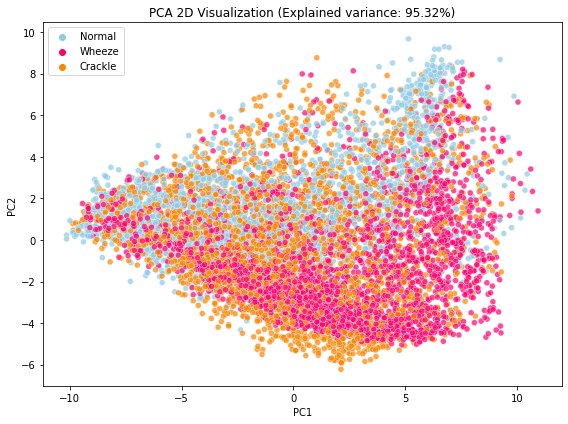

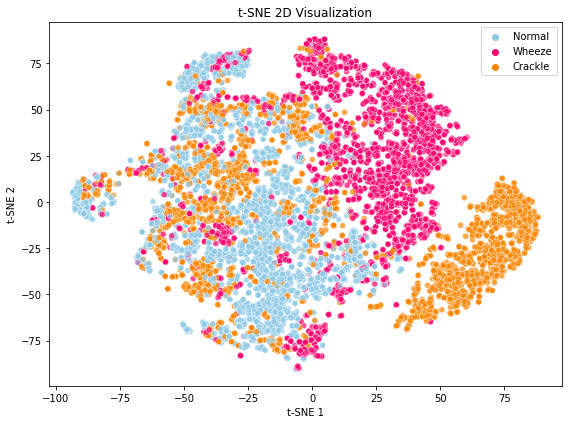

In [48]:
from utils.plots import perform_pca_and_tsne
training_labels_std = np.load("training_labels_std.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_std,  # shape: (cycles, features)
    labels=training_labels_std,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2462 0.2557 0.2311 0.2386 0.2652]
Mean Domain Classification Accuracy: 0.2473 ± 0.0121


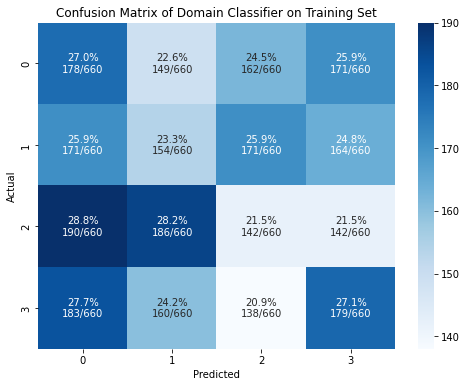

In [49]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_std[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()

### **CLASS SPECIFIC SPECTRAL WHITENING**

In [50]:
from domain_adaptation_algorithms.spectrum_whitening import *

whitener = ClassWiseSpectralWhitening(n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

train_files = [os.path.join(RAW_CYCLE_FOLDER, f) for f in train_df["file"]]
train_labels = train_df["class"].tolist()
train_devices = [next((d for d in DEVICES if d in f), None) for f in train_df["file"]]

# Fit on raw data
whitener.fit(train_files, train_labels, train_devices, reference_device=REFERENCE_DEVICE)

Fitting whitening: 100%|██████████| 5113/5113 [00:02<00:00, 2515.45it/s]


In [51]:
# Transform on training set
WHITENED_TRAIN_FOLDER = "corrected_train_whitened"
os.makedirs(WHITENED_TRAIN_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(final_train_df["file"], final_train_df["class"]), total=len(final_train_df), desc="Applying Spectrum Whitening on training set"):
    path_in = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    path_out = os.path.join(WHITENED_TRAIN_FOLDER, fname)

    if not os.path.exists(path_in):
        print(f"[!] Missing: {path_in}")
        continue

    y, _ = librosa.load(path_in, sr=SAMPLING_RATE)
    y_corr = whitener.transform(y, class_name=label)
    sf.write(path_out, y_corr, SAMPLING_RATE)

Applying Spectrum Whitening on training set: 100%|██████████| 8739/8739 [01:22<00:00, 105.74it/s]


In [52]:
# Transform on test set
WHITENED_TEST_FOLDER = "corrected_test_whitened"
os.makedirs(WHITENED_TEST_FOLDER, exist_ok=True)

for fname, label in tqdm(zip(test_df["file"], test_df["class"]), total=len(test_df), desc="Applying Spectrum Whitening on test set"):
    path_in = os.path.join(CLEANED_CYCLE_FOLDER, fname)
    path_out = os.path.join(WHITENED_TEST_FOLDER, fname)

    if not os.path.exists(path_in):
        print(f"[!] Missing: {path_in}")
        continue

    y, _ = librosa.load(path_in, sr=SAMPLING_RATE)
    y_corr = whitener.transform(y, class_name=label)
    sf.write(path_out, y_corr, SAMPLING_RATE)

Applying Spectrum Whitening on test set: 100%|██████████| 1279/1279 [00:16<00:00, 78.10it/s]


In [53]:
from utils.audio_preprocessing import extract_acoustic_features

# Mapping filename to label 
filename_to_label = dict(zip(final_train_df["file"], final_train_df["class"]))

train_feature_list = []
train_filename_list = []
train_label_list = []

train_wav_files = [f for f in os.listdir(WHITENED_TRAIN_FOLDER) if f.endswith(".wav")]

for fname in tqdm(train_wav_files, desc="Extracting features from corrected training set"):
    path = os.path.join(WHITENED_TRAIN_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    train_feature_list.append(feats)
    train_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    train_label_list.append(label)

# Convert to arrays
train_features_array = np.stack(train_feature_list)
train_filenames_array = np.array(train_filename_list)
train_labels_array = np.array(train_label_list)

train_features_mean = train_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("training_features_whitened.npy", train_features_mean)
np.save("training_filenames_whitened.npy", train_filenames_array)
np.save("training_labels_whitened.npy", train_labels_array)

Extracting features from corrected training set: 100%|██████████| 8739/8739 [03:56<00:00, 37.01it/s]


In [54]:
# Mapping filename to label 
filename_to_label = dict(zip(test_df["file"], test_df["class"]))

test_feature_list = []
test_filename_list = []
test_label_list = []

test_wav_files = [f for f in os.listdir(WHITENED_TEST_FOLDER) if f.endswith(".wav")]

for fname in tqdm(test_wav_files, desc="Extracting features from corrected test set"):
    path = os.path.join(WHITENED_TEST_FOLDER, fname)
    y, sr = librosa.load(path, sr=SAMPLING_RATE)

    feats = extract_acoustic_features(
        y, sr,
        frame_size=FRAME_SIZE,
        hop_size=HOP_SIZE,
        n_mfcc=N_MFCC,
        n_mels=N_MELS
    )

    test_feature_list.append(feats)
    test_filename_list.append(fname)

    label = filename_to_label.get(fname)
    if label is None:
        print(f"[Warning] No label found for {fname}")
    test_label_list.append(label)

# Convert to arrays
test_features_array = np.stack(test_feature_list)
test_filenames_array = np.array(test_filename_list)
test_labels_array = np.array(test_label_list)

test_features_mean = test_features_array.mean(axis=1)  # shape: (cycles, features)

np.save("test_features_whitened.npy", test_features_mean)
np.save("test_filenames_whitened.npy", test_filenames_array)
np.save("test_labels_whitened.npy", test_labels_array)

Extracting features from corrected test set: 100%|██████████| 1279/1279 [00:33<00:00, 38.63it/s]


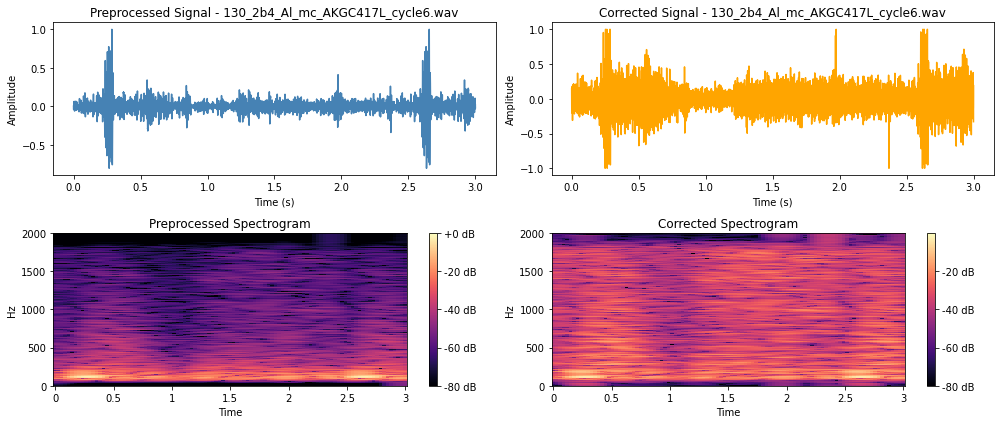

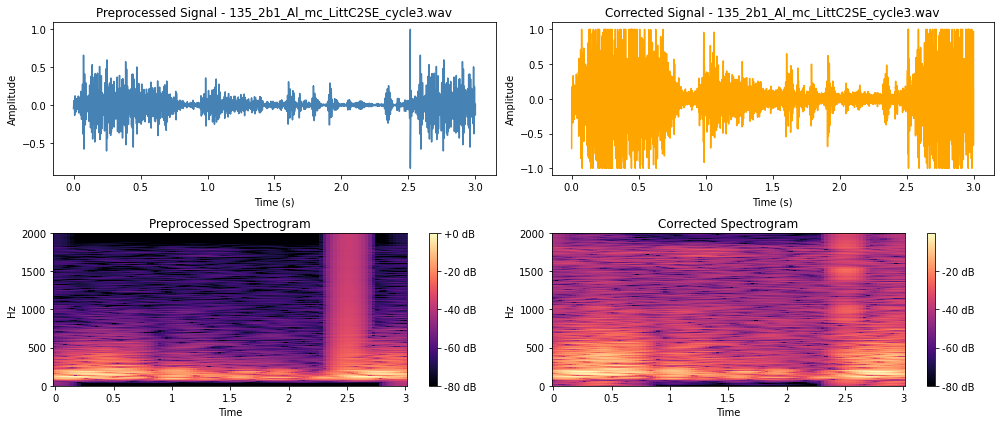

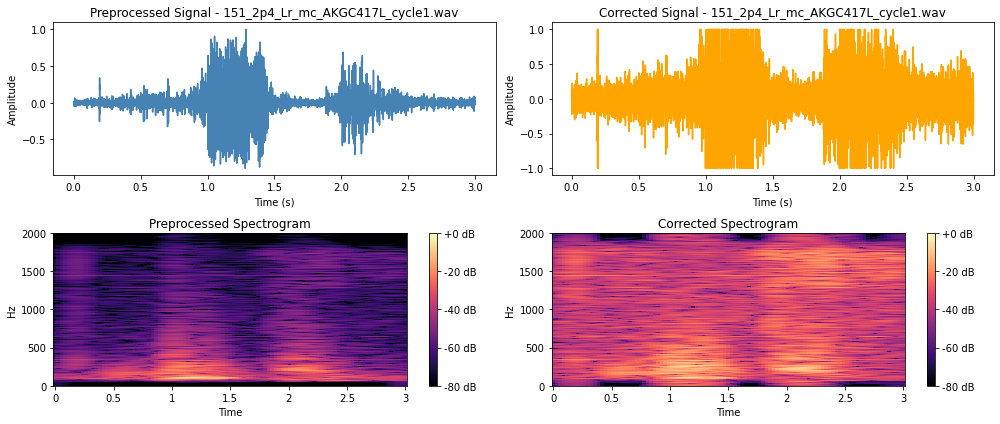

In [56]:
from utils.plots import plot_signals_after_domain_adaptation

# Get the first 3 .wav files that do not originate from the refernece device and plot them
non_ref_train_files = final_train_df[~final_train_df["file"].str.contains(REFERENCE_DEVICE)]["file"].tolist()[:3]

plot_signals_after_domain_adaptation(
    file_list=non_ref_train_files,
    cleaned_folder=CLEANED_CYCLE_FOLDER,
    corrected_folder=WHITENED_TRAIN_FOLDER,
    sampling_rate=SAMPLING_RATE,
    hop_size=HOP_SIZE
)

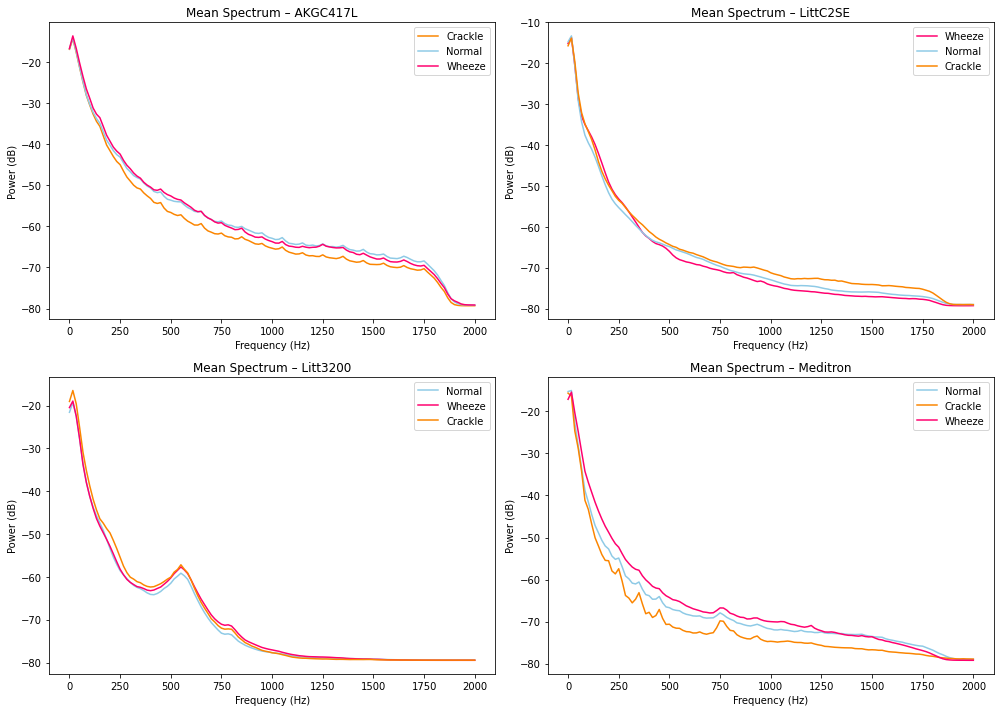

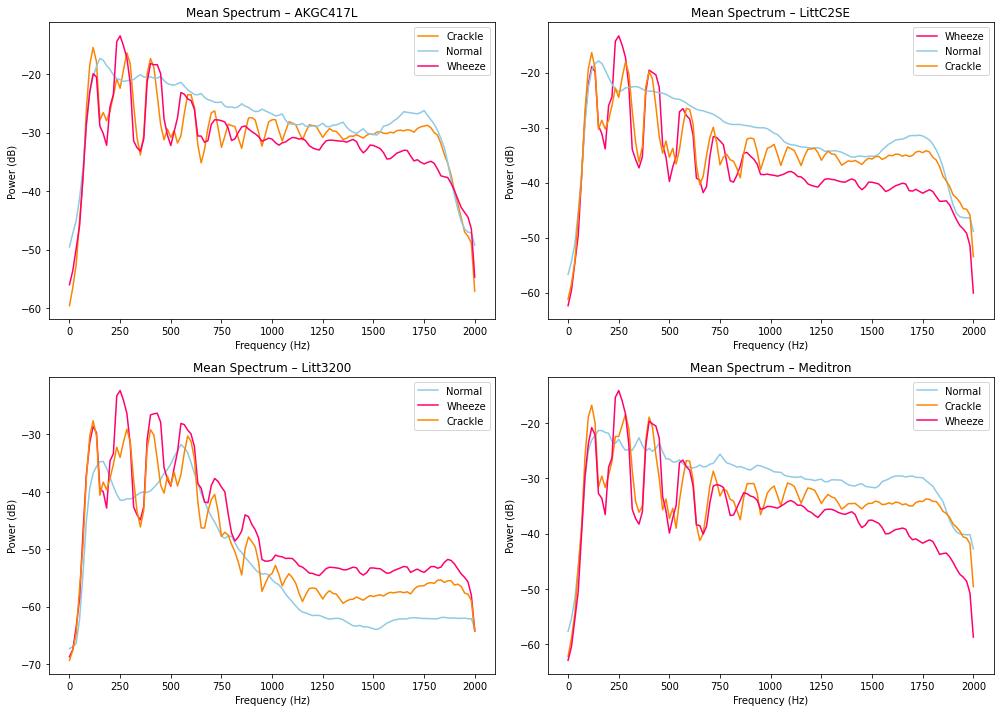

In [57]:
from utils.plots import plot_mean_spectra_per_device

plot_mean_spectra_per_device(
    folder=RAW_CYCLE_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

plot_mean_spectra_per_device(
    folder=WHITENED_TRAIN_FOLDER,
    df=final_train_df,
    devices=DEVICES,
    sampling_rate=SAMPLING_RATE,
    frame_size=FRAME_SIZE,
    hop_size=HOP_SIZE
)

In [58]:
from utils.metrics import mean_wasserstein

x_before = np.load("training_features_mean.npy")               
x_after = np.load("training_features_whitened.npy")        
devices = np.load("training_devices.npy", allow_pickle=True) 

# Results per device
results = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    # Calculate the Wasserstein  distance of the 3 remaining devices from AKGC417L 
    dist_before = mean_wasserstein(X_src_before, X_trg_before)
    dist_after  = mean_wasserstein(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"Wasserstein distance before: {vals['before']:.4f}")
    print(f"Wasserstein distance after:  {vals['after']:.4f}")
    print(f"Wasserstein relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
Wasserstein distance before: 5.7836
Wasserstein distance after:  1.5475
Wasserstein relevant reduction: 73.24%

[LittC2SE → Meditron]
Wasserstein distance before: 9.0538
Wasserstein distance after:  1.5047
Wasserstein relevant reduction: 83.38%

[Litt3200 → Meditron]
Wasserstein distance before: 20.7199
Wasserstein distance after:  1.5744
Wasserstein relevant reduction: 92.40%



In [60]:
from utils.metrics import mean_js_divergence

results_js = {}

for device in DEVICES:
    if device == REFERENCE_DEVICE:
        continue

    X_src_before = x_before[devices == device]
    X_src_after  = x_after[devices == device]
    X_trg_before = x_before[devices == REFERENCE_DEVICE]
    X_trg_after  = x_after[devices == REFERENCE_DEVICE]

    dist_before = mean_js_divergence(X_src_before, X_trg_before)
    dist_after  = mean_js_divergence(X_src_after, X_trg_after)
    reduction   = (dist_before - dist_after) / dist_before

    results_js[device] = {
        "before": dist_before,
        "after": dist_after,
        "reduction_ratio": reduction
    }

for device, vals in results_js.items():
    print(f"[{device} → {REFERENCE_DEVICE}]")
    print(f"JS divergence before: {vals['before']:.4f}")
    print(f"JS divergence after:  {vals['after']:.4f}")
    print(f"JS relevant reduction: {abs(100 * vals['reduction_ratio']):.2f}%\n")

[AKGC417L → Meditron]
JS divergence before: 0.2017
JS divergence after:  0.1240
JS relevant reduction: 38.53%

[LittC2SE → Meditron]
JS divergence before: 0.2485
JS divergence after:  0.1882
JS relevant reduction: 24.25%

[Litt3200 → Meditron]
JS divergence before: 0.4672
JS divergence after:  0.2017
JS relevant reduction: 56.82%



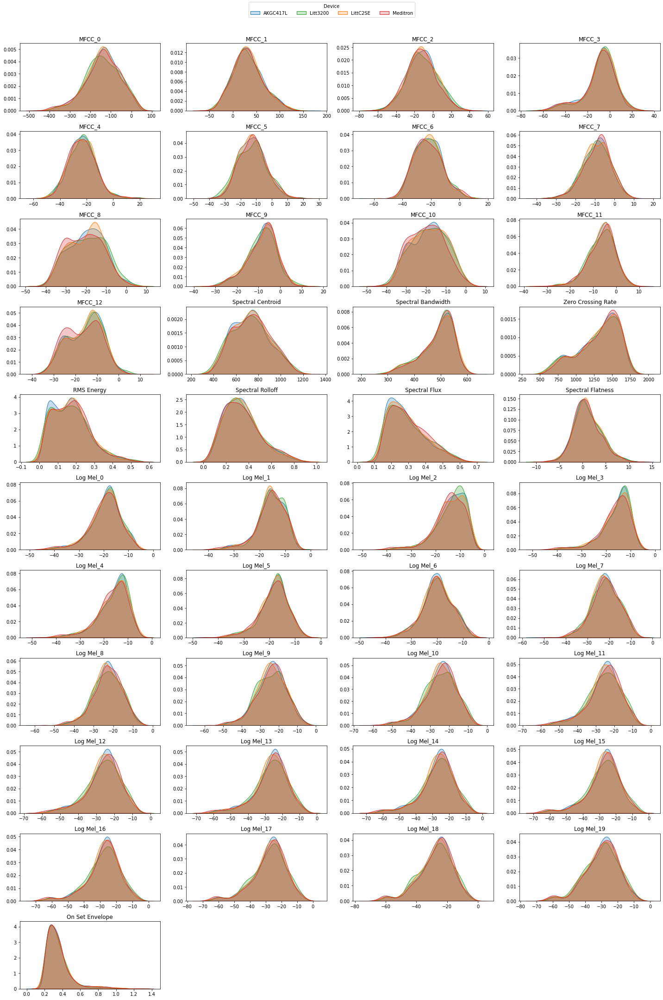

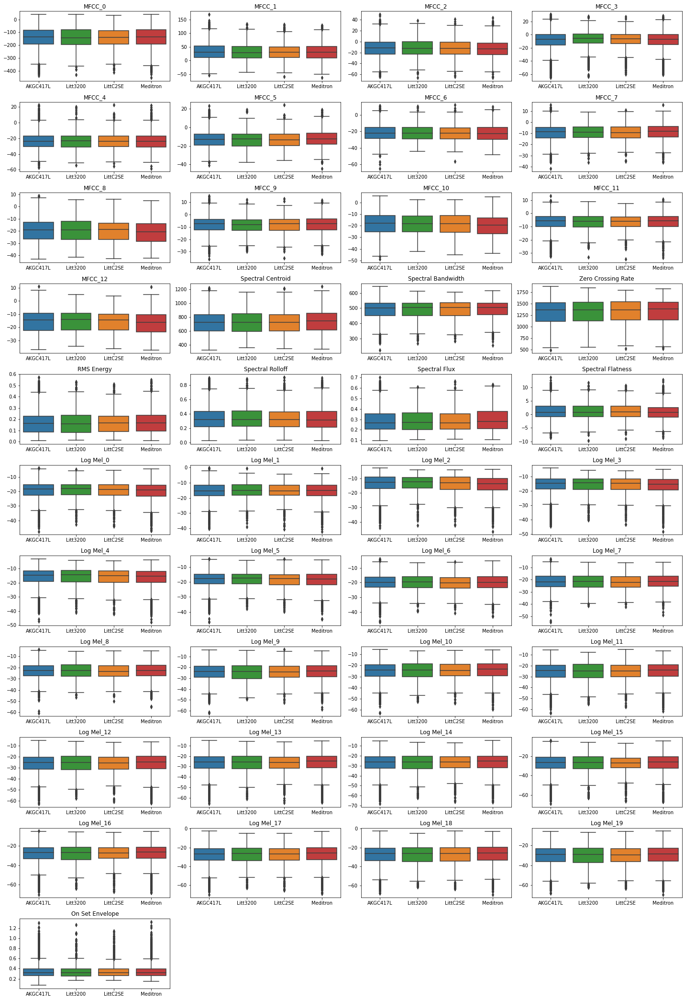

In [61]:
from utils.plots import plot_feature_distributions_by_device

training_features_whitened = np.load("training_features_whitened.npy")  
training_devices = np.load("training_devices.npy")  

plot_feature_distributions_by_device(training_features_whitened, training_devices, FEATURE_NAMES)

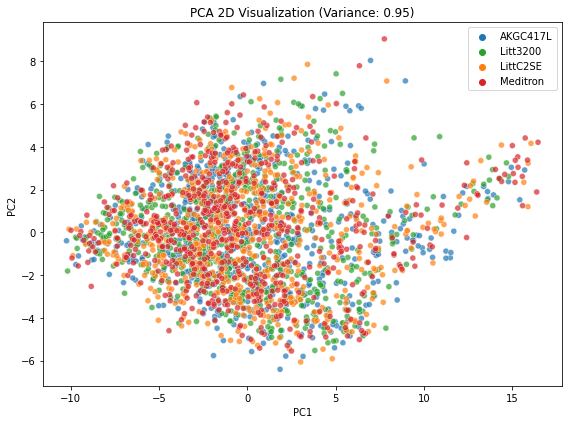

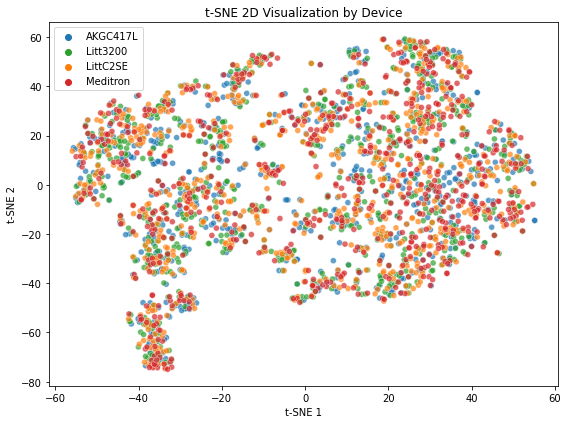

In [62]:
from utils.plots import perform_pca_and_tsne_by_device

# Count samples per device
device_counts = Counter(training_devices)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(training_devices):
    training_features_dev = training_features_whitened[training_devices == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

perform_pca_and_tsne_by_device(
    balanced_training_features,
    balanced_device_labels,
    pca_components=0.95,  
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

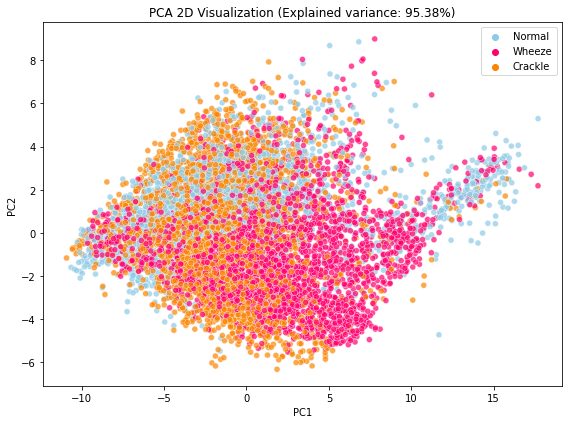

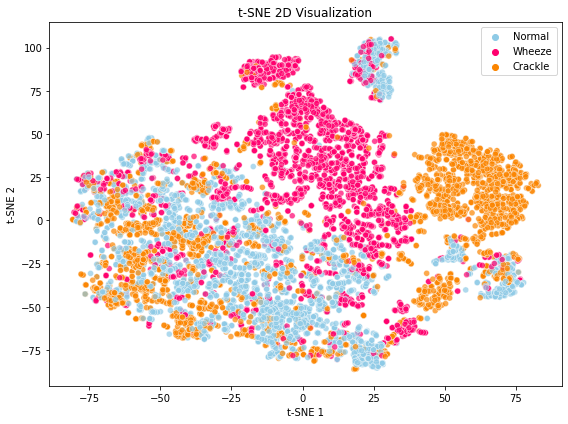

In [63]:
from utils.plots import perform_pca_and_tsne
       
training_labels_whitened = np.load("training_labels_whitened.npy")

perform_pca_and_tsne(
    feature_matrix=training_features_whitened,  # shape: (cycles, features)
    labels=training_labels_whitened,           # shape: (cycles,)
    pca_components=0.95,  # 95% variance
    tsne_components=2,
    perplexity=30,
    feature_names=FEATURE_NAMES,
    plot_feature_contribution=False
)

Accuracy per fold: [0.2633 0.2822 0.2292 0.2216 0.2708]
Mean Domain Classification Accuracy: 0.2534 ± 0.0238


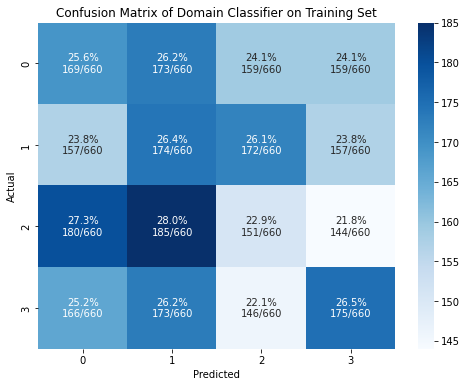

In [64]:
device_labels = np.load("training_devices.npy")   

# Count samples per device
device_counts = Counter(device_labels)
min_count = min(device_counts.values())  # minimum class count

# Select balanced subset by resampling
balanced_training_features = []
balanced_device_labels = []

for device in np.unique(device_labels):
    training_features_dev = training_features_whitened[device_labels == device]
    training_features_bal = resample(training_features_dev, replace=False, n_samples=min_count, random_state=0)
    balanced_training_features.append(training_features_bal)
    balanced_device_labels.extend([device] * len(training_features_bal))

balanced_training_features = np.vstack(balanced_training_features)
balanced_device_labels = np.array(balanced_device_labels)

# Encode device labels
le = LabelEncoder()
y = le.fit_transform(balanced_device_labels)
device_names = le.classes_

# Scale features
scaler = StandardScaler()
X = scaler.fit_transform(balanced_training_features)

# Classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')
print("Accuracy per fold:", np.round(scores, 4))
print("Mean Domain Classification Accuracy: {:.4f} ± {:.4f}".format(scores.mean(), scores.std()))

# Predictions for confusion matrix
y_pred = cross_val_predict(clf, X, y, cv=cv)

# Confusion matrix
cm = confusion_matrix(y, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

labels = np.array([
    [f"{cm_norm[i, j]*100:.1f}%\n{cm[i, j]}/{cm.sum(axis=1)[i]}" for j in range(cm.shape[1])]
    for i in range(cm.shape[0])
])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', cbar=True)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix of Domain Classifier on Training Set")
plt.show()